# Impact of Master's Pay on School Performance
I interned with the Department of Public Instruction and was asked to analyze the relationship between teachers with master's degrees and school performance. The hope was that there was a relationship and this would encourage the NC General Assembly to reinstate master's pay.

At the time I did not know about multiple linear regression so I used a simple linear regression. I want to take the time to share my original results and improve upon them using machine learning techniques.

I'll answer:
1. School Performance Grade/Score with percentage of teachers with advanced degrees
2. What features contribute to whether a school did not meet growth, met growth, or exceeded growth?
3. What features contribute to school performance grades (A-F)?
4. What features contribute to school performance scores?

### Section 0: Importing and cleaning data

In [1]:
#Importing needed modules
import pandas as pd
from pandasql import sqldf
import random
import plotly.express as px
from pandas.api.types import is_numeric_dtype
from scipy.stats import kruskal
from scipy.stats import normaltest
import numpy as np
import scipy.stats as stats
from sklearn import tree
import graphviz
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import Lasso
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [2]:
#Reading in data and selecting specific columns of interest
masters=pd.read_excel("NC Schools.xlsx")
masters=masters[['District.Name', 'State.Board.District', 'Grade.Span', 'Title.I.School', 'EVAAS.Growth.Status',
                 'Graduatio0.Project', 'Summer.Program', 'X4.Year.Cohort.Graduation.Rate.Percent', 
                 'X5.Year.Cohort.Graduation.Rate.Percent', 'SPG.Grade_14', 'SPG.Score_14', 'SPG.Grade_15', 'SPG.Score_15',
                 'avg_daily_attend_pct', 'crime_per_c_num', 'short_susp_per_c_num', 
                 'long_susp_per_c_num', 'expelled_per_c_num', 'stud_internet_comp_num', 
                 'digital_media_pct', 'Byod', 'avg_age_media_collection', 'X_1_to_1_access', 
                 'books_per_student', 'wap_per_classroom', 'sat_avg_score_num', 
                 'sat_participation_pct', 'ap_participation_pct', 'ap_pct_3_or_above', 
                 'school_type_txt', 'calendar_only_txt', 'student_num', 'Grad_project_status', 
                 'stem', 'flicensed_teach_pct', 'tchyrs_0thru3_pct', 'tchyrs_4thru10_pct', 
                 'tchyrs_11plus_pct', 'class_teach_num', 'nbpts_num', 'advance_dgr_pct', 
                 'X_1yr_tchr_trnovr_pct', 'emer_prov_teach_pct', 'lateral_teach_pct', 
                 'highqual_class_pct', 'pct_male', 'pct_female', 'pct_am_in', 'pct_asian', 
                 'pct_hispanic', 'pct_black', 'pct_white', 'pct_multi', 'pct_pac_is', 'CEP', 
                 'Final.ADM', 'Free', 'Reduced', 'EDS_pct', 'three_yr_atten_ratio', 
                 'three_yr_atten_rank', 'Appro_Amount', 'Per_Pupil_Appro', 'Rank_Appro', 
                 'No.Degree_pct', 'Vocational_pct', 'Bachelor_pct', 'Masters_pct', 'Advanced_pct', 
                 'Doctorate_pct', 'State_PPE', 'State_PPE_Rank', 'Federal_PPE', 'Federal_PPE_Rank', 
                 'Local_PPE', 'Local_PPE_Rank', 'Total_PPE', 'Total_PPE_Rank', 
                 'num_teaching_positions', 'num_teachers_rec_suppl', 'average_suppl', 
                 'num_principals', 'principals_rec_suppl', 'princ_avg_suppl', 'num_asst_prin', 
                 'asst_prin_rec_suppl', 'avg_asst_prin_supp', 't_num_of_buses', 't_num_of_Pupils', 
                 't_Miles', 't_Cost', 't_Cost_Per_Bus', 't_Cost_Per_Pupil', 't_Cost_Per_Mile']]

#Creating percentages columns for students using free or reduced lunch
masters['Reduced_pct'] = 100*masters['Reduced']/masters['Final.ADM']
masters['Free_pct'] = 100*masters['Free']/masters['Final.ADM']

#Creating dummy variables for several columns
masters=pd.get_dummies(masters, prefix=['District', 'School_Type', 'Calendar'],
               columns=['State.Board.District', 'school_type_txt', 'calendar_only_txt'], drop_first=True)

#Removing spaces from column names
masters.columns = masters.columns.str.replace(' ', '_')

#Removing * from 5 year graduation rate
masters=masters.replace('*', 0)

#Removing observations with missing values for the output
masters=masters[masters['SPG.Grade_14'].notna()]

#Viewing data
masters.head()

,District.Name,Grade.Span,Title.I.School,EVAAS.Growth.Status,Graduatio0.Project,Summer.Program,X4.Year.Cohort.Graduation.Rate.Percent,X5.Year.Cohort.Graduation.Rate.Percent,SPG.Grade_14,SPG.Score_14,...,District_Northwest_Region,District_Piedmont_Triad_Region,District_SandHills_Region,District_Southeast_Region,District_Southwest_Region,District_Western_Region,School_Type_Magnet_School,School_Type_Regular_School,Calendar_Traditional_Calendar_plus_Year-Round_Calendar,Calendar_Year-Round_Calendar
0,Gates County Schools,High School,0,Exceeded,0,0,87.1,89.7,B,71,...,0,0,0,0,0,0,0,1,0,0
1,Henderson County Schools,High School,0,Exceeded,1,1,95.0,95.0,B,82,...,0,0,0,0,0,1,0,1,0,0
2,Haywood County Schools,High School,0,Met,0,0,86.1,90.3,C,69,...,0,0,0,0,0,1,0,1,0,0
3,Carteret County Public Schools,High School,0,Exceeded,0,0,90.6,90.5,A,89,...,0,0,0,1,0,0,0,1,0,0
4,Cabarrus County Schools,0K-05,0,NotMet,0,0,0.0,0.0,B,76,...,0,0,0,0,1,0,0,1,0,0


In [3]:
#There was a problem with fitting the deicision tree which indicated there was a problem with the data.
#Printing unique values to try to find the problems.
for col in masters.columns:
    print(col, masters[col].unique())

District.Name ['Gates County Schools' 'Henderson County Schools'
 'Haywood County Schools' 'Carteret County Public Schools'
 'Cabarrus County Schools' 'Union County Public Schools'
 'Gaston County Schools' 'Buncombe County Schools'
 'Alexander County Schools' 'Burke County Schools' 'Yancey County Schools'
 'Wake County Schools' 'Weldon City Schools' 'Brunswick County Schools'
 'Moore County Schools' 'Pender County Schools'
 'Rutherford County Schools' 'Robeson County Schools'
 'McDowell County Schools' 'Macon County Schools' 'Polk County Schools'
 'Montgomery County Schools' 'Jackson County Schools'
 'Randolph County Schools' 'Dare County Schools' 'Lexington City Schools'
 'Guilford County Schools' 'Cleveland County Schools'
 'Rowan-Salisbury Schools' 'Avery County Schools'
 'Scotland County Schools' 'Bladen County Schools' 'Durham Public Schools'
 'Onslow County Schools' 'Charlotte-Mecklenburg Schools'
 'Lenoir County Public Schools' 'Pasquotank County Schools'
 'Yadkin County Schools

In [4]:
#Removing * from 5 year graduation rate
masters=masters.replace('*', 0)

#Removing - from Byod
masters['Byod']=masters['Byod'].replace('-', 0)

In [5]:
masters.describe()

,Title.I.School,Graduatio0.Project,Summer.Program,X4.Year.Cohort.Graduation.Rate.Percent,X5.Year.Cohort.Graduation.Rate.Percent,SPG.Score_14,SPG.Score_15,avg_daily_attend_pct,crime_per_c_num,short_susp_per_c_num,...,District_Northwest_Region,District_Piedmont_Triad_Region,District_SandHills_Region,District_Southeast_Region,District_Southwest_Region,District_Western_Region,School_Type_Magnet_School,School_Type_Regular_School,Calendar_Traditional_Calendar_plus_Year-Round_Calendar,Calendar_Year-Round_Calendar
count,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,...,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000,2275.000000
mean,0.563077,0.076484,0.361758,18.600659,18.615121,61.777582,62.062857,0.953728,0.528330,13.544778,...,0.077363,0.175385,0.106813,0.096703,0.198681,0.072088,0.052308,0.947253,0.001319,0.046593
std,0.496114,0.265829,0.480615,36.224977,36.467270,13.531706,13.612362,0.016876,0.757912,17.239169,...,0.267225,0.380379,0.308943,0.295618,0.399095,0.258690,0.222696,0.223578,0.036298,0.210813
min,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,7.000000,0.809000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,53.000000,53.000000,0.946000,0.000000,2.720000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,0.000000,62.000000,62.000000,0.954000,0.240000,7.610000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,0.000000,0.000000,71.000000,71.000000,0.961000,0.780000,17.730000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,95.000000,95.000000,99.000000,99.000000,1.000000,7.690000,176.420000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
#Separating data into predictors and y
X=masters.drop(columns='SPG.Score_14')
y=masters['SPG.Score_14']

#Splitting data once to create test sets
X_train_bad, X_test, y_train_bad, y_test = train_test_split(X, y, test_size=0.1, random_state=844)
#Verifying that the test is 10%
print('Test %', len(X_test)/len(X))
print('Test count',len(X_test))

#Splitting data again to create training and validation
X_train, X_valid, y_train, y_valid = train_test_split(X_train_bad, y_train_bad, test_size=0.22, random_state=844)
#Checking percentages
print('Train %', len(X_train)/len(X))
print('Valid %', len(X_valid)/len(X))

Test % 0.10021978021978022
Test count 228
Train % 0.7015384615384616
Valid % 0.19824175824175824


In [7]:
#Visualizing numeric data with histograms
for col in X_train.columns:
    if is_numeric_dtype(X_train[col])==True:
        fig1=px.histogram(X_train[col])
        fig1.show()

### Section 1: Relationship between school performance grades and percentage of teachers with advanced degrees.

#### Is the percentage of teachers with advanced degrees different across whether a school did not meet, met growth, or exceeded growth?

In [8]:
#Creating dataframes for schools that did not meet growth, met growth, or exceeded growth
NotMet=X_train[X_train['EVAAS.Growth.Status']=='NotMet']
Met=X_train[X_train['EVAAS.Growth.Status']=='Met']
Exceeded=X_train[X_train['EVAAS.Growth.Status']=='Exceeded']

In [9]:
#Visualizing the data to see if it is normal enough to use an ANOVA
fig2=px.histogram(NotMet, x='advance_dgr_pct', 
                  title='Histogram of teachers with advanced degrees for schools that did not meet growth',
                  labels={'advance_dgr_pct': 'Percent of teachers with advanced degrees'})
fig3=px.histogram(Met, x='advance_dgr_pct', 
                  title='Histogram of teachers with advanced degrees for schools that met growth',
                  labels={'advance_dgr_pct': 'Percent of teachers with advanced degrees'})
fig4=px.histogram(Exceeded, x='advance_dgr_pct', 
                  title='Histogram of teachers with advanced degrees for schools that exceeded growth',
                  labels={'advance_dgr_pct': 'Percent of teachers with advanced degrees'})
fig2.show()
fig3.show()
fig4.show()
#Some are questionableon their normality

In [10]:
#I'm not certain if some of these are close enough, so I want to see a statstical test of normality
k1, p1 = normaltest(NotMet['advance_dgr_pct'])
k2, p2 = normaltest(Met['advance_dgr_pct'])
k3, p3 = normaltest(Exceeded['advance_dgr_pct'])
print(p1, p2, p3)
#Not normal

0.14624089260067472 0.08883907994314343 0.0005080457225521841


In [11]:
#Testing if there is a difference in distribution of teachers with advanced degrees in schools with 
#different levels of EVAAS growth
stat, p=kruskal(NotMet['advance_dgr_pct'], Met['advance_dgr_pct'], Exceeded['advance_dgr_pct'])
print('The p-value is ' + str(p))

if (p>0.0054):
    print('This shows that there is NOT a difference in percentage of teachers with advanced degrees.')
else:
    print('This shows that there IS a difference in percentage of teachers with advanced degrees.')

The p-value is 0.006656456203483043
This shows that there is NOT a difference in percentage of teachers with advanced degrees.


In [12]:
#Visualizing differences in percentage of teachers with advanced degrees with boxplots
fig5 = px.box(X_train, x="EVAAS.Growth.Status", y="advance_dgr_pct", 
              labels={'EVAAS.Growth.Status': 'EVAAS Growth Status',
                        'advance_dgr_pct': '% of teachers with advanced degrees'})
fig5.update_layout(title={'text':'Growth Status and % of teachers with advanced degrees', 'x':0.5})
fig5.show()

While the distributions are different, there doesn't seem to be a drastic difference. We can see that schools that did not meet growth have fewer teachers with advanced degrees generally compared to schools that met growth. However, schools that exceeded growth generally had fewer teachers with advanced degrees than those that met growth.

### Examining relationship between school score and % of teachers with advanced degrees

In [13]:
#Combining X and y for ease
Xy_train=pd.concat([X_train, y_train], axis=1)

In [14]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with advanced degrees.
fig6=px.scatter(Xy_train, x='advance_dgr_pct', y='SPG.Score_14', trendline='ols', 
                labels={'advance_dgr_pct':'% of teachers with advanced degrees',
                       'SPG.Score_14':'2014 School Performance Score'})
fig6.update_layout(title={'text':'Relationship between school performance scores and teacher advanced degrees','x':0.5})
fig6.show()

### Examining if this continues for Master's degrees too.

In [15]:
#Visualizing for normality
fig7=px.histogram(NotMet, x='Masters_pct', 
                  title="Histogram of teachers with master's degrees for schools that did not meet growth",
                  labels={'Masters_pct': "Percent of teachers with master's degrees"})
fig8=px.histogram(Met, x='Masters_pct', 
                  title="Histogram of teachers with master's degrees for schools that met growth",
                  labels={'Masters_pct': "Percent of teachers with master's degrees"})
fig9=px.histogram(Exceeded, x='Masters_pct', 
                  title="Histogram of teachers with msater's degrees for schools that exceeded growth",
                  labels={'Masters_pct': "Percent of teachers with master's degrees"})
fig7.show()
fig8.show()
fig9.show()
#These are definitely not normal. So Kruskal-Wallis test it is.

In [16]:
#Testing if there is a difference in distribution of teachers with masters degrees in schools with 
#different levels of EVAAS growth
stat, p=kruskal(NotMet['Masters_pct'], Met['Masters_pct'], Exceeded['Masters_pct'])
print('The p-value is ' + str(p))

if (p>0.0054):
    print('This shows that there is NOT a difference in percentage of teachers with masters degrees.')
else:
    print('This shows that there IS a difference in percentage of teachers with masters degrees.')

The p-value is 1.9274888794013978e-05
This shows that there IS a difference in percentage of teachers with masters degrees.


In [17]:
#Visualizing differences in percentage of teachers with masters degrees with boxplots
fig10 = px.box(Xy_train, x="EVAAS.Growth.Status", y="Masters_pct", 
               labels={'EVAAS.Growth.Status': 'EVAAS Growth Status',
                    'Masters_pct': "% of teachers with master's degrees"})
fig10.update_layout(title={'text': "Growth Status and % of teachers with master's degrees", 'x':0.5})
fig10.show()

It seems like for most NC Schools, there are no more than 40% of teachers with master's degrees. The medians for those that met growth and those that did not meet growth are the same. Yet those that exceeded growth seemed to have a lower median for the percentage of teachers with master's degrees.

### Examining relationship between school score and % of teachers with masters degrees

In [18]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig11=px.scatter(Xy_train, x='Masters_pct', y='SPG.Score_14', trendline='ols', 
                labels={'Masters_pct':"% of teachers with master's degrees",
                       'SPG.Score_14':'2014 School Performance Score'})
fig11.update_layout(title={'text':"Relationship between school performance scores and teacher master's degrees",'x':0.5})
fig11.show()

# Section 2: What features contribute to whether a school did not meet growth, met growth, or exceeded growth?

In [19]:
#Creating matrices to complete a decision tree below
Xy_train=Xy_train[Xy_train['EVAAS.Growth.Status'].notna()]
X=Xy_train.drop(columns=['EVAAS.Growth.Status', 'District.Name', 'Grade.Span', 'SPG.Grade_14', 'SPG.Grade_15', 'SPG.Score_14',
                        'SPG.Score_15', 'sat_avg_score_num', 'sat_participation_pct',
                        'ap_participation_pct', 'ap_pct_3_or_above', 'Final.ADM', 'Reduced', 'Free', 'pct_female'])
y=Xy_train['EVAAS.Growth.Status']

In [20]:
#Shortening decision tree classifier
dt=tree.DecisionTreeClassifier(criterion="gini", max_depth=10, min_samples_leaf=50)

#I tried gini and entropy and gini proved to be the best. I tried different pruning depths and 10 with a minimum leaf size of
#50 seemed to produce a reasonably sized tree

In [21]:
#Fitting decision tree
dt=dt.fit(X, y)

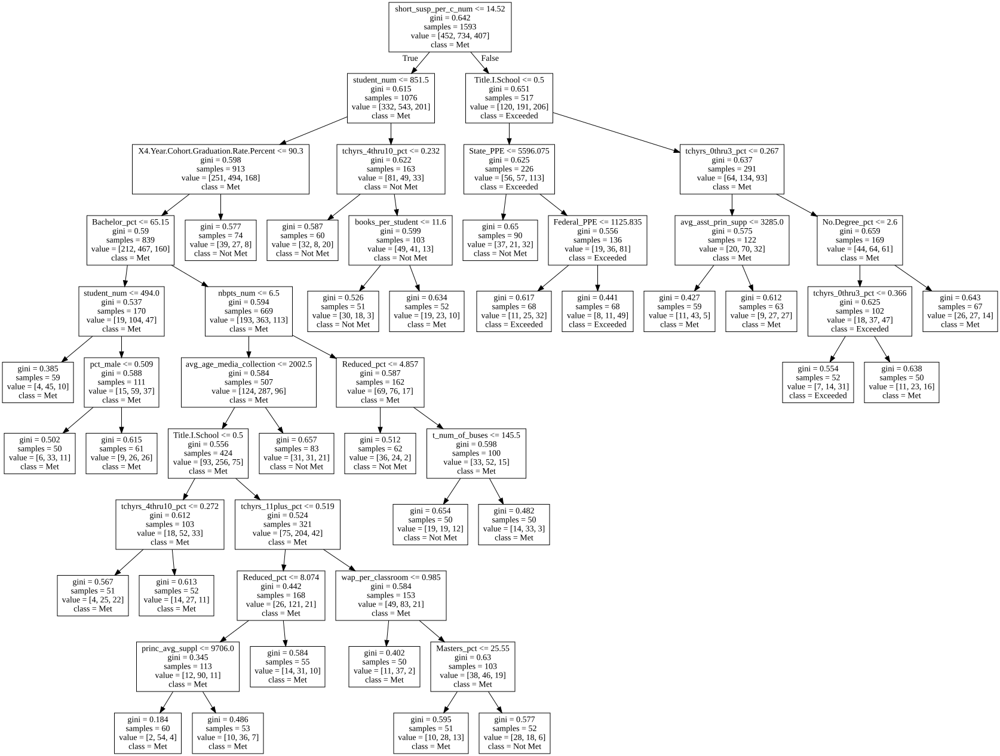

In [22]:
#Visuazlizing the tree itself (and saving it as a PDF)
X_feature_names = list(X.columns)
dot_data = tree.export_graphviz(dt, out_file=None, feature_names=X_feature_names, class_names=['Not Met', 'Met', 'Exceeded'])
graph = graphviz.Source(dot_data) 
graph.render("masters")
graph

In [23]:
#Creating predicitions based on this tree
y_pred = dt.predict(X)

#What is the goodness of fit?
print("Goodness of fit:",metrics.accuracy_score(y, y_pred))

Goodness of fit: 0.5536723163841808


In [24]:
#Creating matrices to complete a decision tree below
X_valid_simp=X_valid[X_valid['EVAAS.Growth.Status'].notna()]
Valid_growth=X_valid_simp['EVAAS.Growth.Status']
X_valid_simp=X_valid_simp.drop(columns=['EVAAS.Growth.Status', 'District.Name', 'Grade.Span', 'SPG.Grade_14', 'SPG.Grade_15',
                        'SPG.Score_15', 'sat_avg_score_num', 'sat_participation_pct',
                        'ap_participation_pct', 'ap_pct_3_or_above', 'Final.ADM', 'Reduced', 'Free', 'pct_female'])
y_pred_valid = dt.predict(X_valid_simp)

#Accuracy on validation
print(metrics.accuracy_score(Valid_growth, y_pred_valid))

#Gini performed slightly better on validation

0.4311111111111111


In [25]:
#Seeing if variable importance provides any extra information for interpreting the tree.
feat_importance = dt.tree_.compute_feature_importances(normalize=False)
var_importance = {}
var_import=[]
for i in range(0, len(X_feature_names)):
    if feat_importance[i] > 0:
        var_importance[X_feature_names[i]] = feat_importance[i]
        #Storing a list of significant variables for later use
        var_import.append(X_feature_names[i])

    
sort_var_import=sorted(var_importance.items(), key=lambda x: x[1], reverse=True)
for i in sort_var_import:
    print(str(i[0]) + ': ' + str(i[1]))

short_susp_per_c_num: 0.015108347520026369
student_num: 0.011380456998139454
Title.I.School: 0.008888967400633656
X4.Year.Cohort.Graduation.Rate.Percent: 0.005073714588406155
State_PPE: 0.00449663972865262
tchyrs_0thru3_pct: 0.004458137014333371
Reduced_pct: 0.004202372317510771
tchyrs_4thru10_pct: 0.004151037245113765
Bachelor_pct: 0.004049190953790505
avg_asst_prin_supp: 0.004021384291798396
nbpts_num: 0.0038080071391699893
avg_age_media_collection: 0.003598599986784909
tchyrs_11plus_pct: 0.0029726144603216065
Masters_pct: 0.0028745120266672097
No.Degree_pct: 0.0027874232123329427
wap_per_classroom: 0.0027285963436949607
Federal_PPE: 0.0022801964476939665
t_num_of_buses: 0.001895794099183934
pct_male: 0.0016893173621894692
princ_avg_suppl: 0.001362796989430756
books_per_student: 0.001219766143441716


The most important variable for predicting growth short term suspensions followed by access to books. There are some variables that related to race and gender which is concerning.

# Section 3: What features contribute to school performance grades?

## Fitting a decision tree for school performance grades (A-F)

In [26]:
#Creating data matrix for seeing relationship between school performance grade and other variables
X2=Xy_train.drop(columns=['EVAAS.Growth.Status', 'District.Name', 'Grade.Span', 'SPG.Grade_14', 'SPG.Score_14', 'SPG.Grade_15',
                        'SPG.Score_15', 'sat_avg_score_num', 'sat_participation_pct',
                        'ap_participation_pct', 'ap_pct_3_or_above', 'Final.ADM', 'Reduced', 'Free', 'pct_female'])
y2=Xy_train['SPG.Grade_14']

In [27]:
dt2=tree.DecisionTreeClassifier(criterion="gini", max_depth=10, min_samples_leaf=50)

In [28]:
#Fitting tree
dt2=dt2.fit(X2, y2)

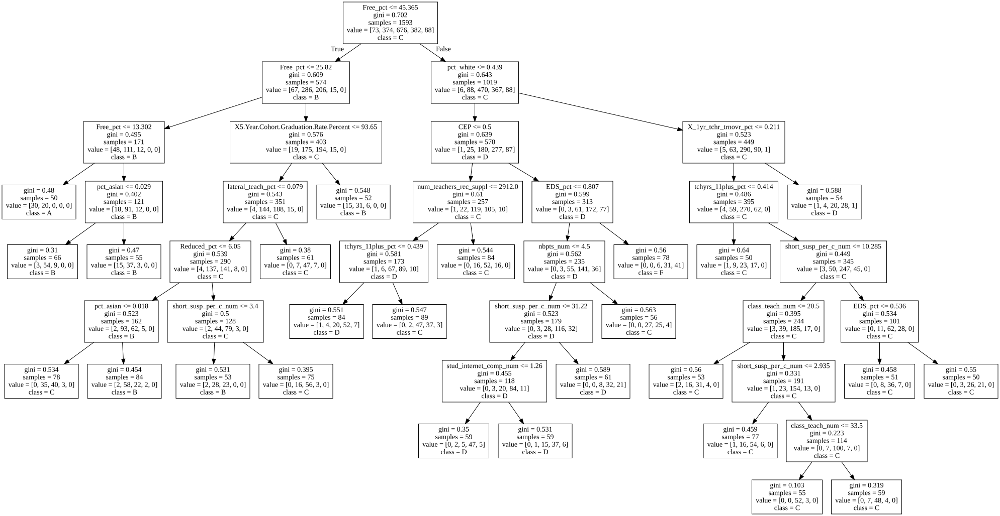

In [29]:
#Visualizing tree
X2_feature_names = list(X2.columns)
dot_data = tree.export_graphviz(dt2, out_file=None, feature_names=X2_feature_names, class_names=['A', 'B', 'C', 'D', 'F'])
graph = graphviz.Source(dot_data) 
graph.render("masters_grade")
graph

In [30]:
#Seeing if variable importance provides any extra information
feat_importance2 = dt2.tree_.compute_feature_importances(normalize=False)
var_importance2 = {}
var_import2=[]
for i in range(0, len(X2_feature_names)):
    if feat_importance2[i] > 0:
        var_importance2[X2_feature_names[i]] = feat_importance2[i]
        #Storing a list of significant variables for later use
        var_import2.append(X2_feature_names[i])

    
sort_var_import2=sorted(var_importance2.items(), key=lambda x: x[1], reverse=True)
for i in sort_var_import2:
    print(str(i[0]) + ': ' + str(i[1]))

Free_pct: 0.09971993642266046
pct_white: 0.03507910473888719
CEP: 0.012442989610284432
short_susp_per_c_num: 0.010941296617275378
EDS_pct: 0.00948494503660345
X5.Year.Cohort.Graduation.Rate.Percent: 0.008237577633928612
X_1yr_tchr_trnovr_pct: 0.007004563539552841
lateral_teach_pct: 0.0068504123103509725
num_teachers_rec_suppl: 0.006613597774619091
tchyrs_11plus_pct: 0.006527518064765833
Reduced_pct: 0.004851818680706386
pct_asian: 0.00459944940912813
nbpts_num: 0.004245308314978528
class_teach_num: 0.0027284394405038687
stud_internet_comp_num: 0.001074616702309896


In [31]:
#Predicting values based on tree
y_pred2 = dt2.predict(X2)

#What is the goodness of fit?
print("Goodness of fit:",metrics.accuracy_score(y2, y_pred2))

Goodness of fit: 0.6365348399246704


In [32]:
#Creating matrices to complete a decision tree below
Valid_grade=X_valid['SPG.Grade_14']
X_valid_simp=X_valid.drop(columns=['EVAAS.Growth.Status', 'District.Name', 'Grade.Span', 'SPG.Grade_14',
                        'SPG.Grade_15', 'SPG.Score_15', 'sat_avg_score_num', 'sat_participation_pct',
                        'ap_participation_pct', 'ap_pct_3_or_above', 'Final.ADM', 'Reduced', 'Free', 'pct_female'])
y_pred2_valid = dt2.predict(X_valid_simp)


#Accuracy
print("Accuracy:",metrics.accuracy_score(Valid_grade, y_pred2_valid))

#Gini did better on accuracy

Accuracy: 0.5742793791574279


# Section 4: What features contribute to school performance scores?

In [33]:
#Standardizing data for LASSO Regression
scaler=StandardScaler()
stand_X = scaler.fit_transform(X2)
stand_X_train = pd.DataFrame(stand_X, columns=X2_feature_names)

np_y_train = Xy_train['SPG.Score_14'].to_numpy()

stand_y_train = scaler.fit_transform(np_y_train.reshape(-1,1))

#Standardize validation data
X_v=X_valid.drop(columns=['EVAAS.Growth.Status', 'District.Name', 'Grade.Span', 'SPG.Grade_14', 'SPG.Grade_15',                         'SPG.Score_15', 'sat_avg_score_num', 'sat_participation_pct',
                        'ap_participation_pct', 'ap_pct_3_or_above', 'Final.ADM', 'Reduced', 'Free', 'pct_female'])
stand_X_v = scaler.fit_transform(X_v)
stand_X_valid = pd.DataFrame(stand_X_v, columns=X_v.columns)

np_y_valid = y_valid.to_numpy()

stand_y_valid = scaler.fit_transform(np_y_valid.reshape(-1,1))

In [34]:
#I used the significant variables from the decision trees for growth and school performance grade as a starting point

#X3 has variables from school performance grade model
X3=stand_X_train[var_import2]
X3_v=stand_X_valid[var_import2]

#X4 has variables from the growth model
X4=stand_X_train[var_import]
X4_v=stand_X_valid[var_import]

In [35]:
# Creating a function to repeat LASSO

def lasso_model(x, y, x_valid, y_valid, alpha):
    # fit
    model = Lasso(alpha=alpha, normalize=False, random_state=543)
    model.fit(x, y)
    pred = model.predict(x_valid)
    coef = model.coef_
    
    #MAE
    diff=abs(y_valid-pred)
    print("Alpha", alpha, "MAE:",np.mean(diff))

In [36]:
# Create list of alpha values to test
alpha_lasso = [1e-15, 1e-10, 1e-8, 1e-5,1e-4, 1e-3,1e-2, 1e-1, 1, 5, 10]

# Run function for X3
for elem in alpha_lasso:
    lasso_model(X3, stand_y_train, X3_v, stand_y_valid, elem)

Alpha 1e-15 MAE: 1.0598259574758355
Alpha 1e-10 MAE: 1.0598259574135598
Alpha 1e-08 MAE: 1.059825951248212
Alpha 1e-05 MAE: 1.0598197244644405
Alpha 0.0001 MAE: 1.0597138445356868
Alpha 0.001 MAE: 1.0587218237314724
Alpha 0.01 MAE: 1.0490680194835145
Alpha 0.1 MAE: 0.9758763029029716
Alpha 1 MAE: 0.8065188776461923
Alpha 5 MAE: 0.8065188776461923
Alpha 10 MAE: 0.8065188776461923


C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 228.76667252944836, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 228.73755819345035, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 225.84604080667597, tolerance: 0.1593



An alpha >= 1 gave all 0 coefficients. So I'm using 0.1 as my alpha level.

In [37]:
model = Lasso(alpha=0.1,normalize=False, random_state=543)
model.fit(X3, stand_y_train)

for i in range(0, len(var_importance2)):
    print(var_import2[i], model.coef_[i])

X5.Year.Cohort.Graduation.Rate.Percent 0.0697600249956844
short_susp_per_c_num -0.1409222934693484
stud_internet_comp_num 0.0
tchyrs_11plus_pct 0.0
class_teach_num -0.0
nbpts_num 0.03163390357117309
X_1yr_tchr_trnovr_pct -0.011663078280249574
lateral_teach_pct -0.0
pct_asian 0.033695498457658235
pct_white 0.11170060484576151
CEP -0.11753437618282292
EDS_pct -0.4299172412112122
num_teachers_rec_suppl 0.0
Reduced_pct 0.0
Free_pct -0.0


In [38]:
dict_LASSO_X3 = {'Variable':var_import2,'Coefficient':model.coef_}
LASSO_X3 = pd.DataFrame(dict_LASSO_X3)

#Removing zero coefficients
LASSO_X3_Sig = LASSO_X3[LASSO_X3['Coefficient'] != 0]
LASSO_X3_Sig.reset_index(drop=True, inplace=True)
prop=pd.DataFrame(['5-Year Graduation Rate', 'Number of Short-Term Suspensions',  
                   'Teachers with National Board Certification', '% of 1st Year Teacher Turnover',
                   '% Asian', '% White', 'Community Eligibility Provision Indicator',
                   '% of Economically Disadvantaged Students'], columns=['Variable Name'])
LASSO_X3_Sig=pd.concat([LASSO_X3_Sig, prop], axis=1)
LASSO_X3_Sig['Index']=LASSO_X3_Sig['Variable']
LASSO_X3_Sig.set_index('Index', inplace=True)
LASSO_X3_Sig

,Variable,Coefficient,Variable Name
Index,,,
X5.Year.Cohort.Graduation.Rate.Percent,X5.Year.Cohort.Graduation.Rate.Percent,0.069760,5-Year Graduation Rate
short_susp_per_c_num,short_susp_per_c_num,-0.140922,Number of Short-Term Suspensions
nbpts_num,nbpts_num,0.031634,Teachers with National Board Certification
X_1yr_tchr_trnovr_pct,X_1yr_tchr_trnovr_pct,-0.011663,% of 1st Year Teacher Turnover
pct_asian,pct_asian,0.033695,% Asian
pct_white,pct_white,0.111701,% White
CEP,CEP,-0.117534,Community Eligibility Provision Indicator
EDS_pct,EDS_pct,-0.429917,% of Economically Disadvantaged Students


In [39]:
#Creating function to put variable coefficients back into regular units
def unstdev(l, coef):
    for elem in coef['Variable']:
        l.append(coef.loc[elem, 'Coefficient']*(np.std(y_train)/np.std(X_train[elem])))
    print(l)

In [40]:
coef_unstd_X3=[]
unstdev(coef_unstd_X3, LASSO_X3_Sig)
coef_unstd_X3

[0.025793769568054008, -0.10794593381248668, 0.09000485796799168, -1.8835497126746041, 9.692995122415372, 5.665946013306935, -3.5490473496856194, -24.58489899800995]


[0.025793769568054008,
 -0.10794593381248668,
 0.09000485796799168,
 -1.8835497126746041,
 9.692995122415372,
 5.665946013306935,
 -3.5490473496856194,
 -24.58489899800995]

In [41]:
#Creating a plot ot visualize information 
fig12 = px.bar(LASSO_X3_Sig, x="Variable Name", y="Coefficient")
fig12.update_layout(title={'text':'Coefficients for each Selected Variable', 'x':0.5})
fig12.show()

In [42]:
# Run function for X4
for elem in alpha_lasso:
    lasso_model(X4, stand_y_train, X4_v, stand_y_valid, elem)

Alpha 1e-15 MAE: 1.0091367458779181
Alpha 1e-10 MAE: 1.0091367478118511
Alpha 1e-08 MAE: 1.0091369392731147
Alpha 1e-05 MAE: 1.0091453053861297
Alpha 0.0001 MAE: 1.0087904998559192
Alpha 0.001 MAE: 1.0077913694276608
Alpha 0.01 MAE: 0.9992292874115666
Alpha 0.1 MAE: 0.9282269754715522
Alpha 1 MAE: 0.8065188776461923
Alpha 5 MAE: 0.8065188776461923
Alpha 10 MAE: 0.8065188776461923


C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 350.1844948389075, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 350.18341233052985, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 350.0762586101176, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 256.18861675746734, tolerance: 0.1593

C:\Users\amlaw

An alpha >= 1 gave all 0 coefficients. So I'm using 0.1 as my alpha level.

In [43]:
model = Lasso(alpha=0.1, normalize=False, random_state=543)
model.fit(X4, stand_y_train)
for i in range(0, len(var_importance)):
    print(var_import[i], model.coef_[i])

Title.I.School -0.24103533396890026
X4.Year.Cohort.Graduation.Rate.Percent 0.06268973041008703
short_susp_per_c_num -0.29076576021741085
avg_age_media_collection -0.0
books_per_student -0.0
wap_per_classroom -0.0
student_num 0.0
tchyrs_0thru3_pct -0.11007242472344694
tchyrs_4thru10_pct 0.0
tchyrs_11plus_pct 0.0
nbpts_num 0.1364449514563181
pct_male -0.04207072163949079
No.Degree_pct -0.0
Bachelor_pct -0.0
Masters_pct 0.0
State_PPE -0.0
Federal_PPE -0.08955989609560006
princ_avg_suppl 0.0
avg_asst_prin_supp 0.0
t_num_of_buses 0.0
Reduced_pct 0.0


In [44]:
dict_LASSO_X4 = {'Variable':var_import,'Coefficient':model.coef_}
LASSO_X4 = pd.DataFrame(dict_LASSO_X4)

#Removing zero coefficients
LASSO_X4_Sig = LASSO_X4[LASSO_X4['Coefficient'] != 0]
LASSO_X4_Sig.reset_index(drop=True, inplace=True)
prop=pd.DataFrame(['Title 1 School Indicator', '4-Year Graduation Rate', 
                   'Number of Short-Term Suspensions', '% of Teachers with < 3 Years Experience', 
                   'Teachers with National Board Certification',
                   '% Male', 'Federal Per Pupil Expenditure'], columns=['Variable Name'])
LASSO_X4_Sig=pd.concat([LASSO_X4_Sig, prop], axis=1)
LASSO_X4_Sig['Index']=LASSO_X4_Sig['Variable']
LASSO_X4_Sig.set_index('Index', inplace=True)

LASSO_X4_Sig

,Variable,Coefficient,Variable Name
Index,,,
Title.I.School,Title.I.School,-0.241035,Title 1 School Indicator
X4.Year.Cohort.Graduation.Rate.Percent,X4.Year.Cohort.Graduation.Rate.Percent,0.062690,4-Year Graduation Rate
short_susp_per_c_num,short_susp_per_c_num,-0.290766,Number of Short-Term Suspensions
tchyrs_0thru3_pct,tchyrs_0thru3_pct,-0.110072,% of Teachers with < 3 Years Experience
nbpts_num,nbpts_num,0.136445,Teachers with National Board Certification
pct_male,pct_male,-0.042071,% Male
Federal_PPE,Federal_PPE,-0.089560,Federal Per Pupil Expenditure


In [45]:
coef_unstd_X4=[]
unstdev(coef_unstd_X4, LASSO_X4_Sig)
coef_unstd_X4

[-6.551427349832599, 0.023418161470048597, -0.22272545198246363, -12.757002238620933, 0.38821350165164015, -12.28666671553594, -0.003874099531762476]


[-6.551427349832599,
 0.023418161470048597,
 -0.22272545198246363,
 -12.757002238620933,
 0.38821350165164015,
 -12.28666671553594,
 -0.003874099531762476]

In [46]:
#Creating a plot ot visualize information 
fig13 = px.bar(LASSO_X4_Sig, x="Variable Name", y="Coefficient")
fig13.update_layout(title={'text':'Coefficients for each Selected Variable', 'x':0.5})
fig13.show()

In [47]:
#Using as many variables that will converge
#I had to go through several iterations where I removed variables until the model converged. I used all significant variables
#from previous LASSO models and what I learned was significant as a teacher to determine which variables to remove first.
#I also removed variables that could measure similar ideas in schools. 
X5=stand_X_train[['Title.I.School', 'Graduatio0.Project', 'Summer.Program', 
            'X4.Year.Cohort.Graduation.Rate.Percent', 'avg_daily_attend_pct', 'crime_per_c_num', 'short_susp_per_c_num', 
                 'long_susp_per_c_num', 'expelled_per_c_num', 'stud_internet_comp_num', 
                 'digital_media_pct', 'avg_age_media_collection', 'X_1_to_1_access', 
                 'books_per_student', 'student_num', 
                 'stem', 'flicensed_teach_pct', 'tchyrs_0thru3_pct', 'tchyrs_4thru10_pct', 
                 'class_teach_num', 'nbpts_num', 'advance_dgr_pct', 
                 'X_1yr_tchr_trnovr_pct', 'emer_prov_teach_pct', 'lateral_teach_pct', 
                 'highqual_class_pct', 'pct_male', 'pct_hispanic', 'pct_black', 'pct_white', 'CEP', 
                 'EDS_pct', 'three_yr_atten_ratio', 
                 'three_yr_atten_rank', 'Appro_Amount', 'Per_Pupil_Appro', 'Rank_Appro', 
                 'Bachelor_pct', 'Masters_pct', 
                 'Doctorate_pct', 'State_PPE', 'State_PPE_Rank', 'Federal_PPE', 'Federal_PPE_Rank', 
                 'Local_PPE', 'Local_PPE_Rank', 'average_suppl', 'princ_avg_suppl', 'avg_asst_prin_supp', 'Free_pct']]

#Validation data
X5_v=stand_X_valid[['Title.I.School', 'Graduatio0.Project', 'Summer.Program', 
            'X4.Year.Cohort.Graduation.Rate.Percent', 'avg_daily_attend_pct', 'crime_per_c_num', 'short_susp_per_c_num', 
                 'long_susp_per_c_num', 'expelled_per_c_num', 'stud_internet_comp_num', 
                 'digital_media_pct', 'avg_age_media_collection', 'X_1_to_1_access', 
                 'books_per_student', 'student_num', 
                 'stem', 'flicensed_teach_pct', 'tchyrs_0thru3_pct', 'tchyrs_4thru10_pct', 
                 'class_teach_num', 'nbpts_num', 'advance_dgr_pct', 
                 'X_1yr_tchr_trnovr_pct', 'emer_prov_teach_pct', 'lateral_teach_pct', 
                 'highqual_class_pct', 'pct_male', 'pct_hispanic', 'pct_black', 'pct_white', 'CEP', 
                 'EDS_pct', 'three_yr_atten_ratio', 
                 'three_yr_atten_rank', 'Appro_Amount', 'Per_Pupil_Appro', 'Rank_Appro', 
                 'Bachelor_pct', 'Masters_pct', 
                 'Doctorate_pct', 'State_PPE', 'State_PPE_Rank', 'Federal_PPE', 'Federal_PPE_Rank', 
                 'Local_PPE', 'Local_PPE_Rank', 'average_suppl', 'princ_avg_suppl', 'avg_asst_prin_supp', 'Free_pct']]

In [48]:
# Run function for X5
for elem in alpha_lasso:
    lasso_model(X5, stand_y_train, X5_v, stand_y_valid, elem)

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 198.29923658003355, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 198.27381035911827, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 195.74851874511052, tolerance: 0.1593

C:\Users\amlaw\miniconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:531: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 38.81430380281179, tolerance: 0.1593



Alpha 1e-15 MAE: 1.0794527119663233
Alpha 1e-10 MAE: 1.0794527117004056
Alpha 1e-08 MAE: 1.079452685374259
Alpha 1e-05 MAE: 1.0794261344350626
Alpha 0.0001 MAE: 1.0791496334471826
Alpha 0.001 MAE: 1.0767061957502024
Alpha 0.01 MAE: 1.0637680949765227
Alpha 0.1 MAE: 0.9785612011456487
Alpha 1 MAE: 0.8065188776461923
Alpha 5 MAE: 0.8065188776461923
Alpha 10 MAE: 0.8065188776461923


An alpha >= 1 gave all 0 coefficients. So I'm using 0.1 as my alpha level.

In [49]:
#Creating model using significant variables from previous LASSO models
model=Lasso(alpha=0.1, normalize=False, random_state=543)
model.fit(X5, stand_y_train)
sig_X5=[]
for i in range(0, len(X5.columns)):
    print(X5.columns[i], model.coef_[i])
    if model.coef_[i]!=0:
        sig_X5.append(X5.columns[i])

Title.I.School -0.0
Graduatio0.Project 0.0
Summer.Program -0.0
X4.Year.Cohort.Graduation.Rate.Percent 0.08197585143760101
avg_daily_attend_pct 0.0
crime_per_c_num -0.0
short_susp_per_c_num -0.12437408162615665
long_susp_per_c_num -0.0
expelled_per_c_num 0.0
stud_internet_comp_num 0.0
digital_media_pct 0.0
avg_age_media_collection 0.0
X_1_to_1_access -0.0
books_per_student -0.0
student_num 0.0
stem 0.0
flicensed_teach_pct 0.0
tchyrs_0thru3_pct -0.02173549861065655
tchyrs_4thru10_pct 0.0
class_teach_num 0.0
nbpts_num 0.04020759596517274
advance_dgr_pct 0.0
X_1yr_tchr_trnovr_pct -0.0
emer_prov_teach_pct -0.0
lateral_teach_pct -0.0
highqual_class_pct 0.0
pct_male -0.027390707180874305
pct_hispanic -0.0
pct_black -0.0
pct_white 0.10431312820109086
CEP -0.1177897053269951
EDS_pct -0.4189119600453084
three_yr_atten_ratio 0.0
three_yr_atten_rank -0.05167415418508846
Appro_Amount 0.0
Per_Pupil_Appro 0.0
Rank_Appro -0.0
Bachelor_pct -0.0
Masters_pct 0.0
Doctorate_pct -0.0
State_PPE -0.0
State_PP

In [50]:
dict_LASSO_X5 = {'Variable':X5.columns,'Coefficient':model.coef_}
LASSO_X5 = pd.DataFrame(dict_LASSO_X5)

#Removing zero coefficients
LASSO_X5_Sig = LASSO_X5[LASSO_X5['Coefficient'] != 0]
LASSO_X5_Sig.reset_index(drop=True, inplace=True)
prop=pd.DataFrame(['4-Year Graduation Rate', 'Number of Short-Term Suspensions',
                   '% of Teachers with < 3 Years Experience', 
                   'Teachers with National Board Certification',
                   '% Male', '% White', 'Community Eligibility Provision Indicator',
                   '% of Economically Disadvantaged Students', 'Three Year Attendance Ranking',
                   '% of Students Eligible for Free Lunch'], columns=['Variable Name'])
LASSO_X5_Sig=pd.concat([LASSO_X5_Sig, prop], axis=1)
LASSO_X5_Sig

,Variable,Coefficient,Variable Name
0,X4.Year.Cohort.Graduation.Rate.Percent,0.081976,4-Year Graduation Rate
1,short_susp_per_c_num,-0.124374,Number of Short-Term Suspensions
2,tchyrs_0thru3_pct,-0.021735,% of Teachers with < 3 Years Experience
3,nbpts_num,0.040208,Teachers with National Board Certification
4,pct_male,-0.027391,% Male
5,pct_white,0.104313,% White
6,CEP,-0.117790,Community Eligibility Provision Indicator
7,EDS_pct,-0.418912,% of Economically Disadvantaged Students
8,three_yr_atten_rank,-0.051674,Three Year Attendance Ranking
9,Free_pct,-0.006943,% of Students Eligible for Free Lunch


In [51]:
#Creating a plot ot visualize information 
fig14 = px.bar(LASSO_X5_Sig, x="Variable Name", y="Coefficient")
fig14.update_layout(title={'text':'Coefficients for each Selected Variable', 'x':0.5})
fig14.show()

# Results: The model using X4 had the best results

In [52]:
model = Lasso(alpha=0.1, normalize=False, random_state=543)
model.fit(X4, stand_y_train)
for i in range(0, len(var_importance)):
    print(var_import[i], model.coef_[i])

Title.I.School -0.24103533396890026
X4.Year.Cohort.Graduation.Rate.Percent 0.06268973041008703
short_susp_per_c_num -0.29076576021741085
avg_age_media_collection -0.0
books_per_student -0.0
wap_per_classroom -0.0
student_num 0.0
tchyrs_0thru3_pct -0.11007242472344694
tchyrs_4thru10_pct 0.0
tchyrs_11plus_pct 0.0
nbpts_num 0.1364449514563181
pct_male -0.04207072163949079
No.Degree_pct -0.0
Bachelor_pct -0.0
Masters_pct 0.0
State_PPE -0.0
Federal_PPE -0.08955989609560006
princ_avg_suppl 0.0
avg_asst_prin_supp 0.0
t_num_of_buses 0.0
Reduced_pct 0.0


Overall, this indicates that an increase in the number of short term suspensions, males, black students, and economically disadvantaged students decrease the school performance score. Only an increase in the number of teachers with national board certification increases the school performance score.

As far as NC policy recommendations, it seems like a pay increase for teachers with national board certification (and possibly funding that assessment for teachers) is the best option. Advanced degrees (or masters degrees) did not have an impact based on this model. However, many teacher education programs for masters degrees do prepare teachers for taking the NBPTS, so in a way paying teachers with NBPTS may simultaneously pay teachers who do have a masters degree.

However, what is more alarming is that the most significant variables were the percentage of economically disadvantaged students, the number of short term suspensions, and the number of black students. This indicates a massive problem within NC schools where we can improve the education and support for students from economically disadvantaged homes and black or African American students.

# Additional Plots for Paper

In [53]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig15=px.scatter(Xy_train, x='nbpts_num', y='SPG.Score_14', trendline='ols', 
                labels={'nbpts_num':"Number of teachers with National Board Certification",
                       'SPG.Score_14':'2014 School Performance Score'})
fig15.update_layout(title={'text':"Relationship between school performance scores and national board certification",'x':0.5})
fig15.show()

fig11.show()

In [54]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig16=px.scatter(masters, x='EDS_pct', y='SPG.Score_14', trendline='ols', 
                labels={'EDS_pct':"Percentage of Economically Disadvantaged Students",
                       'SPG.Score_14':'2014 School Performance Score'})
fig16.update_layout(title={'text':"Relationship between school performance scores and economic disadvantage",'x':0.5})
fig16.update_xaxes(range=[0,1.2])
fig16.update_yaxes(range=[0, 100])
fig16.show()

In [55]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig17=px.scatter(Xy_train, x='short_susp_per_c_num', y='SPG.Score_14', trendline='ols', 
                labels={'short_susp_per_c_num':"Number of Short Term Suspensions",
                       'SPG.Score_14':'2014 School Performance Score'})
fig17.update_layout(title={'text':"Relationship between school performance scores and national board certification",'x':0.5})
fig17.show()

In [56]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [70]:
fig=go.Figure()
fig.add_trace(go.Bar(
    y=LASSO_X3_Sig['Variable Name'], 
    x=LASSO_X3_Sig['Coefficient'], 
    orientation='h',
    name='Growth Decision Tree Variables',
    marker={'color':'orange'}))
fig.add_trace(go.Bar(
    y=LASSO_X4_Sig['Variable Name'], 
    x=LASSO_X4_Sig['Coefficient'], 
    orientation='h',
    name='Grade Decision Tree Variables',
    marker={'color':'blue'}))
fig.add_trace(go.Bar(
    y=LASSO_X5_Sig['Variable Name'], 
    x=LASSO_X5_Sig['Coefficient'], 
    orientation='h',
    name='Selected Variables',
    marker={'color':'light green'}))
fig.update_layout(title='Variable Significance', title_x=0.5, legend=dict(
    yanchor="bottom",
    y=-0.25,
    xanchor="left",
    x=0
))
layout = go.Layout(
    autosize=False,
    width=800,
    height=700)
fig.update_layout(layout)

In [55]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig18=px.scatter(masters, x='pct_white', y='SPG.Score_14', trendline='ols', 
                labels={'pct_white':"% of White Students",
                       'SPG.Score_14':'2014 School Performance Score'})
fig18.update_layout(title={'text':"Relationship between school performance scores and white students",'x':0.5})
fig18.show()

In [56]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig19=px.scatter(masters, x='pct_white', y='EDS_pct', trendline='ols', 
                labels={'pct_white':"% of White Students",
                       'EDS_pct':'% Economically Disadvantaged'})
fig19.update_layout(title={'text':"Relationship between race and economic disadvantage",'x':0.5})
fig19.update_yaxes(range=[0, 1.2])
fig19.show()

In [60]:
np.std(y_train)

13.474272769174744

In [62]:
np.std(X_train['nbpts_num'])

4.735787101884455

In [76]:
model = Lasso(alpha=0.1, normalize=False, random_state=543)
model.fit(X4, stand_y_train)
pred=model.predict(X4_v)

[58.59643881 62.73713503 57.91846187 61.88248337 61.88248337 61.88248337
 61.88248337 60.3818615  61.88248337 61.88248337 63.74264297 61.3089315
 61.88248337 61.88248337 61.88248337 61.88248337 60.66150964 61.88248337
 61.88248337 61.88248337 61.88248337]


In [168]:
px.box(X_train, y='Federal_PPE', x='Title.I.School')

In [4]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
fig20=px.scatter(masters, x='Masters_pct', y='SPG.Score_14', trendline='ols', 
                labels={'Masters_pct':"Percentage of Teachers with Master's Degrees",
                       'SPG.Score_14':'2014 School Performance Score'})
fig20.update_layout(title={'text':"Relationship between school performance scores and percent of teachers with master's degrees",'x':0.5})

fig20.show()

In [5]:
#Fitting a linear regression to see the relationship between school score and the percent of teachers with masters degrees.
sat_masters=masters[masters['sat_avg_score_num']>0]
fig21=px.scatter(sat_masters, x='Masters_pct', y='sat_avg_score_num', trendline='ols', 
                labels={'Masters_pct':"Percentage of Teachers with Master's Degrees",
                       'sat_avg_score_num':'2014 SAT Scores'})
fig21.update_layout(title={'text':"Relationship between SAT scores and percent of teachers with master's degrees",'x':0.5})

fig21.show()

In [3]:
for col in masters.columns:
    print(col)

District.Name
Grade.Span
Title.I.School
EVAAS.Growth.Status
Graduatio0.Project
Summer.Program
X4.Year.Cohort.Graduation.Rate.Percent
X5.Year.Cohort.Graduation.Rate.Percent
SPG.Grade_14
SPG.Score_14
SPG.Grade_15
SPG.Score_15
avg_daily_attend_pct
crime_per_c_num
short_susp_per_c_num
long_susp_per_c_num
expelled_per_c_num
stud_internet_comp_num
digital_media_pct
Byod
avg_age_media_collection
X_1_to_1_access
books_per_student
wap_per_classroom
sat_avg_score_num
sat_participation_pct
ap_participation_pct
ap_pct_3_or_above
student_num
Grad_project_status
stem
flicensed_teach_pct
tchyrs_0thru3_pct
tchyrs_4thru10_pct
tchyrs_11plus_pct
class_teach_num
nbpts_num
advance_dgr_pct
X_1yr_tchr_trnovr_pct
emer_prov_teach_pct
lateral_teach_pct
highqual_class_pct
pct_male
pct_female
pct_am_in
pct_asian
pct_hispanic
pct_black
pct_white
pct_multi
pct_pac_is
CEP
Final.ADM
Free
Reduced
EDS_pct
three_yr_atten_ratio
three_yr_atten_rank
Appro_Amount
Per_Pupil_Appro
Rank_Appro
No.Degree_pct
Vocational_pct
Bache